In [ ]:
# Connect Google Drive with Colab
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Install necessary components
! pip install -r requirements.txt

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 345.9/345.9 MB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.7/52.7 MB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 186.0/186.0 kB 28.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.1/8.1 MB 80.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.4/6.4 MB 82.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 123.4/123.4 kB 19.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.4/64.4 kB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 247.1/247.1 kB 35.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 71.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.5/93.5 kB 15.1 MB/s eta 0:00:00
  Created wheel for ants: filename=ants-0.0.7-py3-none-any.whl size=14522 sha256=38c5cb91e09ddfb12d85863883e3f16f400d7690fa7210f51398c4f1cf99c79d
  

In [ ]:
%matplotlib inline
# matplotlib will be displayed inline in the notebook

import os
import sys

sys.path.append('/content/drive/MyDrive/MRI_Image_Processing/notebooks')
# appending the path to include our custom helper
import helpers
from helpers import *
import ants
import SimpleITK as sitk
print(f'AntsPy Version = {ants.__version__}')
print(f'SimpleITK version = {sitk.__version__}')

AntsPy Version = 0.4.2
SimpleITK version = 2.3.1


In [ ]:
# Define the base directory by getting the directory name of the specified path
BASE_DIR = os.path.dirname("/content/drive/MyDrive/MRI_Image_Processing/")

# Print the path to the project folder
print(f'project folder = {BASE_DIR}')

project folder = /content/drive/MyDrive/MRI_Image_Processing


In [ ]:
import os

# Define the directory path
directory_path = '/content/drive/MyDrive/MRI_Image_Processing/assets/raw_examples/'

# Initialize an empty list to store filenames
raw_examples = []

# Iterate through files in the directory and add filenames with extensions to raw_examples list
for filename in os.listdir(directory_path):
    # Check if the path refers to a file (not a subdirectory)
    if os.path.isfile(os.path.join(directory_path, filename)):
        raw_examples.append(filename)

# Display the updated raw_examples list
print(raw_examples)

['ADNI_136_S_0184_MR_MPR____N3__Scaled_2_Br_20081008132905229_S18601_I119714.nii.gz', 'ADNI_136_S_0195_MR_MPR____N3__Scaled_Br_20090708095227200_S65770_I148270.nii.gz', 'ADNI_136_S_0184_MR_MPR____N3__Scaled_Br_20080123103107781_S18601_I88159.nii.gz', 'ADNI_136_S_0086_MR_MPR____N3__Scaled_Br_20070815111150885_S31407_I67781.nii.gz', 'ADNI_136_S_0195_MR_MPR____N3__Scaled_2_Br_20081008133516751_S12748_I119721.nii.gz', 'ADNI_136_S_0184_MR_MPR____N3__Scaled_2_Br_20081008132712063_S12474_I119712.nii.gz', 'ADNI_136_S_0195_MR_MPR____N3__Scaled_Br_20080123103529723_S19574_I88164.nii.gz', 'ADNI_136_S_0184_MR_MPR-R____N3__Scaled_Br_20080415154909319_S47135_I102840.nii.gz', 'ADNI_136_S_0196_MR_MPR____N3__Scaled_Br_20070215192140032_S13831_I40269.nii.gz', 'ADNI_136_S_0195_MR_MPR____N3__Scaled_Br_20071113184014832_S28912_I81981.nii.gz', 'ADNI_136_S_0196_MR_MPR____N3__Scaled_Br_20070809224441151_S31829_I66740.nii.gz', 'ADNI_136_S_0086_MR_MPR____N3__Scaled_Br_20081013161936541_S49691_I120416.nii.gz', '

shape = (256, 256, 170) -> (Z, X, Y)


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

Brain extraction:  retrieving model weights.
5683832/5683832 [==============================] - 1s 0us/step
Brain extraction:  retrieving template.
14969865/14969865 [==============================] - 2s 0us/step
Brain extraction:  normalizing image to the template.
Brain extraction:  prediction and decoding.
1/1 [==============================] - 7s 7s/step
Brain extraction:  renormalize probability mask to native space.
Probabilistic Brain Mask for: ADNI_136_S_0184_MR_MPR____N3__Scaled_2_Br_20081008132905229_S18601_I119714.nii.gz
ANTsImage (IAL)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (256, 256, 170)
	 Spacing    : (1.0037, 1.0, 1.2025)
	 Origin     : (104.7749, -132.4053, -126.8532)
	 Direction  : [-0.  0. -1. -0.  1.  0.  1.  0.  0.]



interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0184_MR_MPR____N3__Scaled_2_Br_20081008132905229_S18601_I119714.nii.gz
/assets/preprocessed/ADNI_136_S_0184_MR_MPR____N3__Scaled_2_Br_20081008132905229_S18601_I119714/ADNI_136_S_0184_MR_MPR____N3__Scaled_2_Br_20081008132905229_S18601_I119714_brainMaskByDL.nii.gz


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0184_MR_MPR____N3__Scaled_2_Br_20081008132905229_S18601_I119714.nii.gz
/assets/preprocessed/ADNI_136_S_0184_MR_MPR____N3__Scaled_2_Br_20081008132905229_S18601_I119714/ADNI_136_S_0184_MR_MPR____N3__Scaled_2_Br_20081008132905229_S18601_I119714_brainMaskedByDL.nii.gz
shape = (256, 256, 170) -> (Z, X, Y)


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

Brain extraction:  retrieving model weights.
Brain extraction:  retrieving template.
Brain extraction:  normalizing image to the template.
Brain extraction:  prediction and decoding.
1/1 [==============================] - 1s 600ms/step
Brain extraction:  renormalize probability mask to native space.
Probabilistic Brain Mask for: ADNI_136_S_0195_MR_MPR____N3__Scaled_Br_20090708095227200_S65770_I148270.nii.gz
ANTsImage (IAL)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (256, 256, 170)
	 Spacing    : (1.0036, 1.0073, 1.2043)
	 Origin     : (85.2933, -159.3542, -134.2733)
	 Direction  : [-0.0663  0.1704 -0.9831  0.0824  0.9829  0.1648  0.9944 -0.0701 -0.0792]



interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0195_MR_MPR____N3__Scaled_Br_20090708095227200_S65770_I148270.nii.gz
/assets/preprocessed/ADNI_136_S_0195_MR_MPR____N3__Scaled_Br_20090708095227200_S65770_I148270/ADNI_136_S_0195_MR_MPR____N3__Scaled_Br_20090708095227200_S65770_I148270_brainMaskByDL.nii.gz


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0195_MR_MPR____N3__Scaled_Br_20090708095227200_S65770_I148270.nii.gz
/assets/preprocessed/ADNI_136_S_0195_MR_MPR____N3__Scaled_Br_20090708095227200_S65770_I148270/ADNI_136_S_0195_MR_MPR____N3__Scaled_Br_20090708095227200_S65770_I148270_brainMaskedByDL.nii.gz
shape = (256, 256, 170) -> (Z, X, Y)


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

Brain extraction:  retrieving model weights.
Brain extraction:  retrieving template.
Brain extraction:  normalizing image to the template.
Brain extraction:  prediction and decoding.
1/1 [==============================] - 0s 421ms/step
Brain extraction:  renormalize probability mask to native space.
Probabilistic Brain Mask for: ADNI_136_S_0184_MR_MPR____N3__Scaled_Br_20080123103107781_S18601_I88159.nii.gz
ANTsImage (IAL)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (256, 256, 170)
	 Spacing    : (1.0037, 0.9933, 1.2025)
	 Origin     : (104.7749, -132.4053, -126.8532)
	 Direction  : [-0.  0. -1. -0.  1.  0.  1.  0.  0.]



interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0184_MR_MPR____N3__Scaled_Br_20080123103107781_S18601_I88159.nii.gz
/assets/preprocessed/ADNI_136_S_0184_MR_MPR____N3__Scaled_Br_20080123103107781_S18601_I88159/ADNI_136_S_0184_MR_MPR____N3__Scaled_Br_20080123103107781_S18601_I88159_brainMaskByDL.nii.gz


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0184_MR_MPR____N3__Scaled_Br_20080123103107781_S18601_I88159.nii.gz
/assets/preprocessed/ADNI_136_S_0184_MR_MPR____N3__Scaled_Br_20080123103107781_S18601_I88159/ADNI_136_S_0184_MR_MPR____N3__Scaled_Br_20080123103107781_S18601_I88159_brainMaskedByDL.nii.gz
shape = (256, 256, 170) -> (Z, X, Y)


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

Brain extraction:  retrieving model weights.
Brain extraction:  retrieving template.
Brain extraction:  normalizing image to the template.
Brain extraction:  prediction and decoding.
1/1 [==============================] - 0s 366ms/step
Brain extraction:  renormalize probability mask to native space.
Probabilistic Brain Mask for: ADNI_136_S_0086_MR_MPR____N3__Scaled_Br_20070815111150885_S31407_I67781.nii.gz
ANTsImage (IAL)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (256, 256, 170)
	 Spacing    : (1.0069, 1.0065, 1.2038)
	 Origin     : (102.6412, -152.2223, -123.3118)
	 Direction  : [ 4.500e-03  7.110e-02 -9.975e-01  2.000e-04  9.975e-01  7.110e-02
  1.000e+00 -5.000e-04  4.500e-03]



interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0086_MR_MPR____N3__Scaled_Br_20070815111150885_S31407_I67781.nii.gz
/assets/preprocessed/ADNI_136_S_0086_MR_MPR____N3__Scaled_Br_20070815111150885_S31407_I67781/ADNI_136_S_0086_MR_MPR____N3__Scaled_Br_20070815111150885_S31407_I67781_brainMaskByDL.nii.gz


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0086_MR_MPR____N3__Scaled_Br_20070815111150885_S31407_I67781.nii.gz
/assets/preprocessed/ADNI_136_S_0086_MR_MPR____N3__Scaled_Br_20070815111150885_S31407_I67781/ADNI_136_S_0086_MR_MPR____N3__Scaled_Br_20070815111150885_S31407_I67781_brainMaskedByDL.nii.gz
shape = (256, 256, 170) -> (Z, X, Y)


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

Brain extraction:  retrieving model weights.
Brain extraction:  retrieving template.
Brain extraction:  normalizing image to the template.
Brain extraction:  prediction and decoding.


1/1 [==============================] - 0s 385ms/step
Brain extraction:  renormalize probability mask to native space.
Probabilistic Brain Mask for: ADNI_136_S_0195_MR_MPR____N3__Scaled_2_Br_20081008133516751_S12748_I119721.nii.gz
ANTsImage (IAL)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (256, 256, 170)
	 Spacing    : (1.0037, 1.0, 1.2042)
	 Origin     : (102.1162, -127.2424, -122.6349)
	 Direction  : [-0.  0. -1. -0.  1.  0.  1.  0.  0.]



interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0195_MR_MPR____N3__Scaled_2_Br_20081008133516751_S12748_I119721.nii.gz
/assets/preprocessed/ADNI_136_S_0195_MR_MPR____N3__Scaled_2_Br_20081008133516751_S12748_I119721/ADNI_136_S_0195_MR_MPR____N3__Scaled_2_Br_20081008133516751_S12748_I119721_brainMaskByDL.nii.gz


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0195_MR_MPR____N3__Scaled_2_Br_20081008133516751_S12748_I119721.nii.gz
/assets/preprocessed/ADNI_136_S_0195_MR_MPR____N3__Scaled_2_Br_20081008133516751_S12748_I119721/ADNI_136_S_0195_MR_MPR____N3__Scaled_2_Br_20081008133516751_S12748_I119721_brainMaskedByDL.nii.gz
shape = (256, 256, 170) -> (Z, X, Y)


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

Brain extraction:  retrieving model weights.
Brain extraction:  retrieving template.
Brain extraction:  normalizing image to the template.
Brain extraction:  prediction and decoding.


1/1 [==============================] - 1s 613ms/step
Brain extraction:  renormalize probability mask to native space.
Probabilistic Brain Mask for: ADNI_136_S_0184_MR_MPR____N3__Scaled_2_Br_20081008132712063_S12474_I119712.nii.gz
ANTsImage (IAL)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (256, 256, 170)
	 Spacing    : (1.0034, 1.0, 1.204)
	 Origin     : (105.8654, -138.2273, -129.0151)
	 Direction  : [-0.  0. -1. -0.  1.  0.  1.  0.  0.]



interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0184_MR_MPR____N3__Scaled_2_Br_20081008132712063_S12474_I119712.nii.gz
/assets/preprocessed/ADNI_136_S_0184_MR_MPR____N3__Scaled_2_Br_20081008132712063_S12474_I119712/ADNI_136_S_0184_MR_MPR____N3__Scaled_2_Br_20081008132712063_S12474_I119712_brainMaskByDL.nii.gz


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0184_MR_MPR____N3__Scaled_2_Br_20081008132712063_S12474_I119712.nii.gz
/assets/preprocessed/ADNI_136_S_0184_MR_MPR____N3__Scaled_2_Br_20081008132712063_S12474_I119712/ADNI_136_S_0184_MR_MPR____N3__Scaled_2_Br_20081008132712063_S12474_I119712_brainMaskedByDL.nii.gz
shape = (256, 256, 170) -> (Z, X, Y)


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

Brain extraction:  retrieving model weights.
Brain extraction:  retrieving template.
Brain extraction:  normalizing image to the template.
Brain extraction:  prediction and decoding.
1/1 [==============================] - 0s 368ms/step
Brain extraction:  renormalize probability mask to native space.
Probabilistic Brain Mask for: ADNI_136_S_0195_MR_MPR____N3__Scaled_Br_20080123103529723_S19574_I88164.nii.gz
ANTsImage (IAL)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (256, 256, 170)
	 Spacing    : (1.0033, 0.9935, 1.2038)
	 Origin     : (94.7607, -154.5287, -128.2586)
	 Direction  : [ 0.      0.046  -0.9989  0.      0.9989  0.046   1.     -0.     -0.    ]



interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0195_MR_MPR____N3__Scaled_Br_20080123103529723_S19574_I88164.nii.gz
/assets/preprocessed/ADNI_136_S_0195_MR_MPR____N3__Scaled_Br_20080123103529723_S19574_I88164/ADNI_136_S_0195_MR_MPR____N3__Scaled_Br_20080123103529723_S19574_I88164_brainMaskByDL.nii.gz


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0195_MR_MPR____N3__Scaled_Br_20080123103529723_S19574_I88164.nii.gz
/assets/preprocessed/ADNI_136_S_0195_MR_MPR____N3__Scaled_Br_20080123103529723_S19574_I88164/ADNI_136_S_0195_MR_MPR____N3__Scaled_Br_20080123103529723_S19574_I88164_brainMaskedByDL.nii.gz
shape = (256, 256, 170) -> (Z, X, Y)


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

Brain extraction:  retrieving model weights.
Brain extraction:  retrieving template.
Brain extraction:  normalizing image to the template.
Brain extraction:  prediction and decoding.
1/1 [==============================] - 0s 406ms/step
Brain extraction:  renormalize probability mask to native space.
Probabilistic Brain Mask for: ADNI_136_S_0184_MR_MPR-R____N3__Scaled_Br_20080415154909319_S47135_I102840.nii.gz
ANTsImage (IAL)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (256, 256, 170)
	 Spacing    : (1.0072, 1.0076, 1.204)
	 Origin     : (104.3603, -189.4606, -71.9658)
	 Direction  : [-0.0258  0.0137 -0.9996  0.4076  0.9132  0.002   0.9128 -0.4074 -0.0291]



interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0184_MR_MPR-R____N3__Scaled_Br_20080415154909319_S47135_I102840.nii.gz
/assets/preprocessed/ADNI_136_S_0184_MR_MPR-R____N3__Scaled_Br_20080415154909319_S47135_I102840/ADNI_136_S_0184_MR_MPR-R____N3__Scaled_Br_20080415154909319_S47135_I102840_brainMaskByDL.nii.gz


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0184_MR_MPR-R____N3__Scaled_Br_20080415154909319_S47135_I102840.nii.gz
/assets/preprocessed/ADNI_136_S_0184_MR_MPR-R____N3__Scaled_Br_20080415154909319_S47135_I102840/ADNI_136_S_0184_MR_MPR-R____N3__Scaled_Br_20080415154909319_S47135_I102840_brainMaskedByDL.nii.gz
shape = (256, 256, 170) -> (Z, X, Y)


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

Brain extraction:  retrieving model weights.
Brain extraction:  retrieving template.
Brain extraction:  normalizing image to the template.
Brain extraction:  prediction and decoding.
1/1 [==============================] - 0s 386ms/step
Brain extraction:  renormalize probability mask to native space.
Probabilistic Brain Mask for: ADNI_136_S_0196_MR_MPR____N3__Scaled_Br_20070215192140032_S13831_I40269.nii.gz
ANTsImage (IAL)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (256, 256, 170)
	 Spacing    : (1.0034, 0.9936, 1.2042)
	 Origin     : (101.3436, -145.057, -128.2511)
	 Direction  : [-0. -0. -1.  0.  1. -0.  1. -0.  0.]



interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0196_MR_MPR____N3__Scaled_Br_20070215192140032_S13831_I40269.nii.gz
/assets/preprocessed/ADNI_136_S_0196_MR_MPR____N3__Scaled_Br_20070215192140032_S13831_I40269/ADNI_136_S_0196_MR_MPR____N3__Scaled_Br_20070215192140032_S13831_I40269_brainMaskByDL.nii.gz


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0196_MR_MPR____N3__Scaled_Br_20070215192140032_S13831_I40269.nii.gz
/assets/preprocessed/ADNI_136_S_0196_MR_MPR____N3__Scaled_Br_20070215192140032_S13831_I40269/ADNI_136_S_0196_MR_MPR____N3__Scaled_Br_20070215192140032_S13831_I40269_brainMaskedByDL.nii.gz
shape = (256, 256, 170) -> (Z, X, Y)


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

Brain extraction:  retrieving model weights.
Brain extraction:  retrieving template.
Brain extraction:  normalizing image to the template.
Brain extraction:  prediction and decoding.
1/1 [==============================] - 0s 379ms/step
Brain extraction:  renormalize probability mask to native space.
Probabilistic Brain Mask for: ADNI_136_S_0195_MR_MPR____N3__Scaled_Br_20071113184014832_S28912_I81981.nii.gz
ANTsImage (IAL)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (256, 256, 170)
	 Spacing    : (1.0071, 1.0067, 1.204)
	 Origin     : (110.368, -132.557, -113.7634)
	 Direction  : [ 0.     -0.0325 -0.9995 -0.      0.9995 -0.0325  1.      0.     -0.    ]



interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0195_MR_MPR____N3__Scaled_Br_20071113184014832_S28912_I81981.nii.gz
/assets/preprocessed/ADNI_136_S_0195_MR_MPR____N3__Scaled_Br_20071113184014832_S28912_I81981/ADNI_136_S_0195_MR_MPR____N3__Scaled_Br_20071113184014832_S28912_I81981_brainMaskByDL.nii.gz


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0195_MR_MPR____N3__Scaled_Br_20071113184014832_S28912_I81981.nii.gz
/assets/preprocessed/ADNI_136_S_0195_MR_MPR____N3__Scaled_Br_20071113184014832_S28912_I81981/ADNI_136_S_0195_MR_MPR____N3__Scaled_Br_20071113184014832_S28912_I81981_brainMaskedByDL.nii.gz
shape = (256, 256, 170) -> (Z, X, Y)


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

Brain extraction:  retrieving model weights.
Brain extraction:  retrieving template.
Brain extraction:  normalizing image to the template.
Brain extraction:  prediction and decoding.
1/1 [==============================] - 0s 399ms/step
Brain extraction:  renormalize probability mask to native space.
Probabilistic Brain Mask for: ADNI_136_S_0196_MR_MPR____N3__Scaled_Br_20070809224441151_S31829_I66740.nii.gz
ANTsImage (IAL)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (256, 256, 170)
	 Spacing    : (1.0069, 1.0064, 1.204)
	 Origin     : (98.1737, -153.961, -126.2552)
	 Direction  : [ 4.500e-03  6.720e-02 -9.977e-01  2.000e-04  9.977e-01  6.720e-02
  1.000e+00 -5.000e-04  4.500e-03]



interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0196_MR_MPR____N3__Scaled_Br_20070809224441151_S31829_I66740.nii.gz
/assets/preprocessed/ADNI_136_S_0196_MR_MPR____N3__Scaled_Br_20070809224441151_S31829_I66740/ADNI_136_S_0196_MR_MPR____N3__Scaled_Br_20070809224441151_S31829_I66740_brainMaskByDL.nii.gz


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0196_MR_MPR____N3__Scaled_Br_20070809224441151_S31829_I66740.nii.gz
/assets/preprocessed/ADNI_136_S_0196_MR_MPR____N3__Scaled_Br_20070809224441151_S31829_I66740/ADNI_136_S_0196_MR_MPR____N3__Scaled_Br_20070809224441151_S31829_I66740_brainMaskedByDL.nii.gz
shape = (256, 256, 170) -> (Z, X, Y)


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

Brain extraction:  retrieving model weights.
Brain extraction:  retrieving template.
Brain extraction:  normalizing image to the template.
Brain extraction:  prediction and decoding.
1/1 [==============================] - 0s 445ms/step
Brain extraction:  renormalize probability mask to native space.
Probabilistic Brain Mask for: ADNI_136_S_0086_MR_MPR____N3__Scaled_Br_20081013161936541_S49691_I120416.nii.gz
ANTsImage (IAL)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (256, 256, 170)
	 Spacing    : (1.0072, 1.0068, 1.2039)
	 Origin     : (110.5922, -160.6495, -99.2637)
	 Direction  : [-0.0396 -0.0182 -0.999   0.0723  0.9972 -0.021   0.9966 -0.073  -0.0382]



interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0086_MR_MPR____N3__Scaled_Br_20081013161936541_S49691_I120416.nii.gz
/assets/preprocessed/ADNI_136_S_0086_MR_MPR____N3__Scaled_Br_20081013161936541_S49691_I120416/ADNI_136_S_0086_MR_MPR____N3__Scaled_Br_20081013161936541_S49691_I120416_brainMaskByDL.nii.gz


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0086_MR_MPR____N3__Scaled_Br_20081013161936541_S49691_I120416.nii.gz
/assets/preprocessed/ADNI_136_S_0086_MR_MPR____N3__Scaled_Br_20081013161936541_S49691_I120416/ADNI_136_S_0086_MR_MPR____N3__Scaled_Br_20081013161936541_S49691_I120416_brainMaskedByDL.nii.gz
shape = (256, 256, 170) -> (Z, X, Y)


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

Brain extraction:  retrieving model weights.
Brain extraction:  retrieving template.
Brain extraction:  normalizing image to the template.
Brain extraction:  prediction and decoding.
1/1 [==============================] - 1s 598ms/step
Brain extraction:  renormalize probability mask to native space.
Probabilistic Brain Mask for: ADNI_136_S_0195_MR_MPR____N3__Scaled_2_Br_20081008133704276_S19574_I119723.nii.gz
ANTsImage (IAL)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (256, 256, 170)
	 Spacing    : (1.0033, 1.0, 1.2038)
	 Origin     : (94.7635, -154.5293, -128.2586)
	 Direction  : [ 0.      0.046  -0.9989  0.      0.9989  0.046   1.     -0.     -0.    ]



interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0195_MR_MPR____N3__Scaled_2_Br_20081008133704276_S19574_I119723.nii.gz
/assets/preprocessed/ADNI_136_S_0195_MR_MPR____N3__Scaled_2_Br_20081008133704276_S19574_I119723/ADNI_136_S_0195_MR_MPR____N3__Scaled_2_Br_20081008133704276_S19574_I119723_brainMaskByDL.nii.gz


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0195_MR_MPR____N3__Scaled_2_Br_20081008133704276_S19574_I119723.nii.gz
/assets/preprocessed/ADNI_136_S_0195_MR_MPR____N3__Scaled_2_Br_20081008133704276_S19574_I119723/ADNI_136_S_0195_MR_MPR____N3__Scaled_2_Br_20081008133704276_S19574_I119723_brainMaskedByDL.nii.gz
shape = (256, 256, 170) -> (Z, X, Y)


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

Brain extraction:  retrieving model weights.
Brain extraction:  retrieving template.
Brain extraction:  normalizing image to the template.
Brain extraction:  prediction and decoding.
1/1 [==============================] - 0s 378ms/step
Brain extraction:  renormalize probability mask to native space.
Probabilistic Brain Mask for: ADNI_136_S_0086_MR_MPR____N3__Scaled_Br_20070215172221943_S14069_I40172.nii.gz
ANTsImage (IAL)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (256, 256, 170)
	 Spacing    : (1.0035, 0.9937, 1.2032)
	 Origin     : (108.0183, -140.3502, -132.2973)
	 Direction  : [-0.  0. -1. -0.  1.  0.  1.  0.  0.]



interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0086_MR_MPR____N3__Scaled_Br_20070215172221943_S14069_I40172.nii.gz
/assets/preprocessed/ADNI_136_S_0086_MR_MPR____N3__Scaled_Br_20070215172221943_S14069_I40172/ADNI_136_S_0086_MR_MPR____N3__Scaled_Br_20070215172221943_S14069_I40172_brainMaskByDL.nii.gz


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0086_MR_MPR____N3__Scaled_Br_20070215172221943_S14069_I40172.nii.gz
/assets/preprocessed/ADNI_136_S_0086_MR_MPR____N3__Scaled_Br_20070215172221943_S14069_I40172/ADNI_136_S_0086_MR_MPR____N3__Scaled_Br_20070215172221943_S14069_I40172_brainMaskedByDL.nii.gz
shape = (256, 256, 170) -> (Z, X, Y)


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

Brain extraction:  retrieving model weights.
Brain extraction:  retrieving template.
Brain extraction:  normalizing image to the template.
Brain extraction:  prediction and decoding.
1/1 [==============================] - 0s 384ms/step
Brain extraction:  renormalize probability mask to native space.
Probabilistic Brain Mask for: ADNI_136_S_0184_MR_MPR____N3__Scaled_Br_20070215174801158_S12474_I40191.nii.gz
ANTsImage (IAL)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (256, 256, 170)
	 Spacing    : (1.0034, 0.9941, 1.204)
	 Origin     : (105.8654, -138.2273, -129.0151)
	 Direction  : [-0.  0. -1. -0.  1.  0.  1.  0.  0.]



interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0184_MR_MPR____N3__Scaled_Br_20070215174801158_S12474_I40191.nii.gz
/assets/preprocessed/ADNI_136_S_0184_MR_MPR____N3__Scaled_Br_20070215174801158_S12474_I40191/ADNI_136_S_0184_MR_MPR____N3__Scaled_Br_20070215174801158_S12474_I40191_brainMaskByDL.nii.gz


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0184_MR_MPR____N3__Scaled_Br_20070215174801158_S12474_I40191.nii.gz
/assets/preprocessed/ADNI_136_S_0184_MR_MPR____N3__Scaled_Br_20070215174801158_S12474_I40191/ADNI_136_S_0184_MR_MPR____N3__Scaled_Br_20070215174801158_S12474_I40191_brainMaskedByDL.nii.gz
shape = (256, 256, 170) -> (Z, X, Y)


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

Brain extraction:  retrieving model weights.
Brain extraction:  retrieving template.
Brain extraction:  normalizing image to the template.
Brain extraction:  prediction and decoding.
1/1 [==============================] - 0s 388ms/step
Brain extraction:  renormalize probability mask to native space.
Probabilistic Brain Mask for: ADNI_136_S_0195_MR_MPR-R____N3__Scaled_Br_20071110123442398_S39882_I81460.nii.gz
ANTsImage (IAL)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (256, 256, 170)
	 Spacing    : (1.0063, 1.0071, 1.2046)
	 Origin     : (97.1328, -148.8994, -124.875)
	 Direction  : [ 1.420e-02  2.220e-02 -9.997e-01  8.000e-04  9.998e-01  2.220e-02
  9.999e-01 -1.200e-03  1.420e-02]



interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0195_MR_MPR-R____N3__Scaled_Br_20071110123442398_S39882_I81460.nii.gz
/assets/preprocessed/ADNI_136_S_0195_MR_MPR-R____N3__Scaled_Br_20071110123442398_S39882_I81460/ADNI_136_S_0195_MR_MPR-R____N3__Scaled_Br_20071110123442398_S39882_I81460_brainMaskByDL.nii.gz


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0195_MR_MPR-R____N3__Scaled_Br_20071110123442398_S39882_I81460.nii.gz
/assets/preprocessed/ADNI_136_S_0195_MR_MPR-R____N3__Scaled_Br_20071110123442398_S39882_I81460/ADNI_136_S_0195_MR_MPR-R____N3__Scaled_Br_20071110123442398_S39882_I81460_brainMaskedByDL.nii.gz
shape = (256, 256, 170) -> (Z, X, Y)


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

Brain extraction:  retrieving model weights.
Brain extraction:  retrieving template.
Brain extraction:  normalizing image to the template.
Brain extraction:  prediction and decoding.
1/1 [==============================] - 0s 375ms/step
Brain extraction:  renormalize probability mask to native space.
Probabilistic Brain Mask for: ADNI_136_S_0184_MR_MPR____N3__Scaled_Br_20090708094745554_S64785_I148265.nii.gz
ANTsImage (IAL)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (256, 256, 170)
	 Spacing    : (1.0036, 1.0074, 1.204)
	 Origin     : (103.3813, -161.8931, -77.9111)
	 Direction  : [-4.180e-02  9.500e-03 -9.991e-01  2.065e-01  9.785e-01  6.000e-04
  9.776e-01 -2.063e-01 -4.290e-02]



interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0184_MR_MPR____N3__Scaled_Br_20090708094745554_S64785_I148265.nii.gz
/assets/preprocessed/ADNI_136_S_0184_MR_MPR____N3__Scaled_Br_20090708094745554_S64785_I148265/ADNI_136_S_0184_MR_MPR____N3__Scaled_Br_20090708094745554_S64785_I148265_brainMaskByDL.nii.gz


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0184_MR_MPR____N3__Scaled_Br_20090708094745554_S64785_I148265.nii.gz
/assets/preprocessed/ADNI_136_S_0184_MR_MPR____N3__Scaled_Br_20090708094745554_S64785_I148265/ADNI_136_S_0184_MR_MPR____N3__Scaled_Br_20090708094745554_S64785_I148265_brainMaskedByDL.nii.gz
shape = (256, 256, 170) -> (Z, X, Y)


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

Brain extraction:  retrieving model weights.
Brain extraction:  retrieving template.
Brain extraction:  normalizing image to the template.
Brain extraction:  prediction and decoding.
1/1 [==============================] - 0s 417ms/step
Brain extraction:  renormalize probability mask to native space.
Probabilistic Brain Mask for: ADNI_136_S_0195_MR_MPR____N3__Scaled_Br_20070215185520914_S12748_I40254.nii.gz
ANTsImage (IAL)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (256, 256, 170)
	 Spacing    : (1.0037, 0.9938, 1.2042)
	 Origin     : (102.1162, -127.2424, -122.6349)
	 Direction  : [-0.  0. -1. -0.  1.  0.  1.  0.  0.]



interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0195_MR_MPR____N3__Scaled_Br_20070215185520914_S12748_I40254.nii.gz
/assets/preprocessed/ADNI_136_S_0195_MR_MPR____N3__Scaled_Br_20070215185520914_S12748_I40254/ADNI_136_S_0195_MR_MPR____N3__Scaled_Br_20070215185520914_S12748_I40254_brainMaskByDL.nii.gz


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0195_MR_MPR____N3__Scaled_Br_20070215185520914_S12748_I40254.nii.gz
/assets/preprocessed/ADNI_136_S_0195_MR_MPR____N3__Scaled_Br_20070215185520914_S12748_I40254/ADNI_136_S_0195_MR_MPR____N3__Scaled_Br_20070215185520914_S12748_I40254_brainMaskedByDL.nii.gz
shape = (256, 256, 170) -> (Z, X, Y)


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

Brain extraction:  retrieving model weights.
Brain extraction:  retrieving template.
Brain extraction:  normalizing image to the template.
Brain extraction:  prediction and decoding.
1/1 [==============================] - 1s 598ms/step
Brain extraction:  renormalize probability mask to native space.
Probabilistic Brain Mask for: ADNI_136_S_0195_MR_MPR-R____N3__Scaled_Br_20081013162450631_S47389_I120423.nii.gz
ANTsImage (IAL)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (256, 256, 170)
	 Spacing    : (1.0069, 1.0074, 1.2037)
	 Origin     : (93.514, -161.51, -107.4969)
	 Direction  : [-0.0276  0.0889 -0.9957  0.1583  0.9839  0.0834  0.987  -0.1553 -0.0413]



interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0195_MR_MPR-R____N3__Scaled_Br_20081013162450631_S47389_I120423.nii.gz
/assets/preprocessed/ADNI_136_S_0195_MR_MPR-R____N3__Scaled_Br_20081013162450631_S47389_I120423/ADNI_136_S_0195_MR_MPR-R____N3__Scaled_Br_20081013162450631_S47389_I120423_brainMaskByDL.nii.gz


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0195_MR_MPR-R____N3__Scaled_Br_20081013162450631_S47389_I120423.nii.gz
/assets/preprocessed/ADNI_136_S_0195_MR_MPR-R____N3__Scaled_Br_20081013162450631_S47389_I120423/ADNI_136_S_0195_MR_MPR-R____N3__Scaled_Br_20081013162450631_S47389_I120423_brainMaskedByDL.nii.gz
shape = (256, 256, 170) -> (Z, X, Y)


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

Brain extraction:  retrieving model weights.
Brain extraction:  retrieving template.
Brain extraction:  normalizing image to the template.
Brain extraction:  prediction and decoding.
1/1 [==============================] - 0s 387ms/step
Brain extraction:  renormalize probability mask to native space.
Probabilistic Brain Mask for: ADNI_136_S_0184_MR_MPR-R____N3__Scaled_Br_20070819190556867_S28430_I69136.nii.gz
ANTsImage (IAL)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (256, 256, 170)
	 Spacing    : (1.0072, 1.0065, 1.2038)
	 Origin     : (104.6648, -137.5703, -133.8502)
	 Direction  : [-0.     -0.0207 -0.9998  0.      0.9998 -0.0207  1.     -0.      0.    ]



interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0184_MR_MPR-R____N3__Scaled_Br_20070819190556867_S28430_I69136.nii.gz
/assets/preprocessed/ADNI_136_S_0184_MR_MPR-R____N3__Scaled_Br_20070819190556867_S28430_I69136/ADNI_136_S_0184_MR_MPR-R____N3__Scaled_Br_20070819190556867_S28430_I69136_brainMaskByDL.nii.gz


interactive(children=(IntSlider(value=127, description='SLICE', max=255), Output()), _dom_classes=('widget-int…

/assets/raw_examples/ADNI_136_S_0184_MR_MPR-R____N3__Scaled_Br_20070819190556867_S28430_I69136.nii.gz
/assets/preprocessed/ADNI_136_S_0184_MR_MPR-R____N3__Scaled_Br_20070819190556867_S28430_I69136/ADNI_136_S_0184_MR_MPR-R____N3__Scaled_Br_20070819190556867_S28430_I69136_brainMaskedByDL.nii.gz


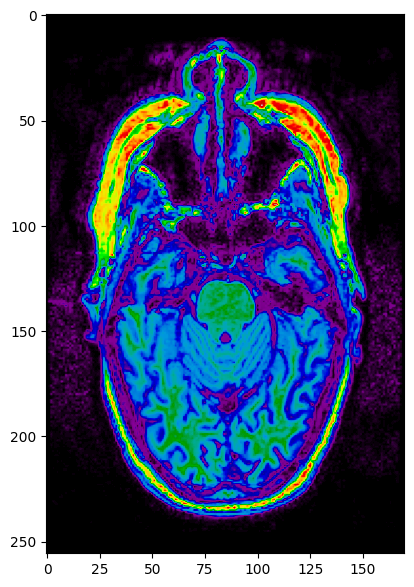

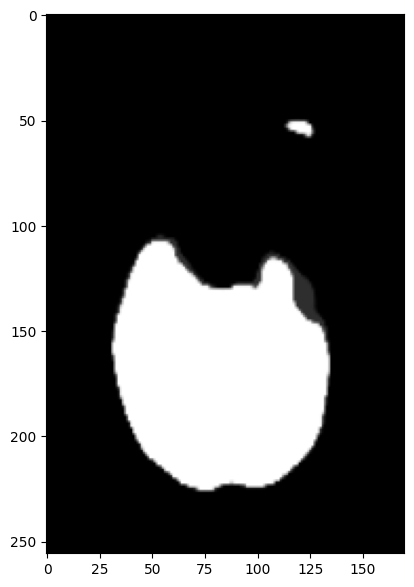

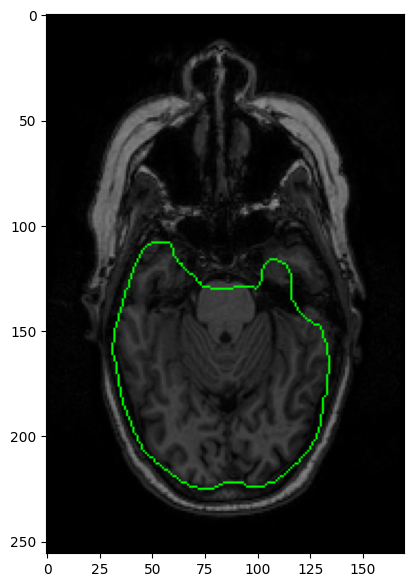

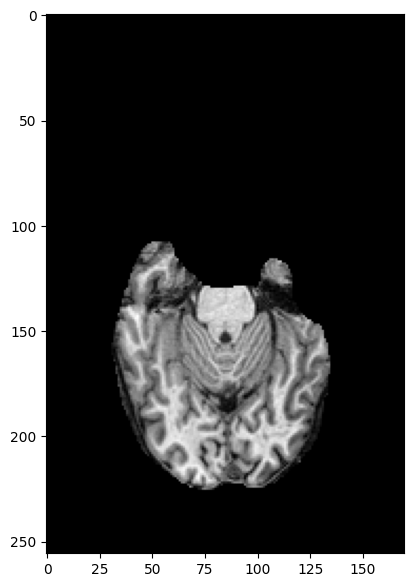

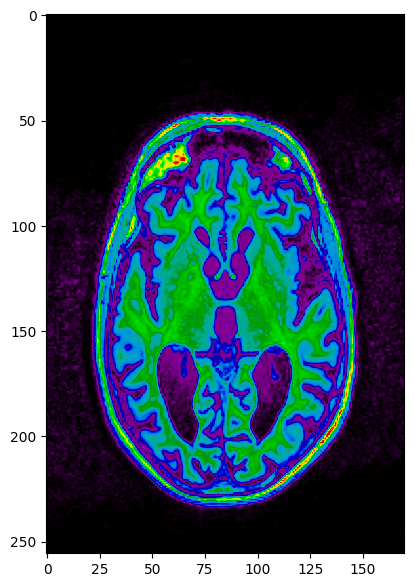

...

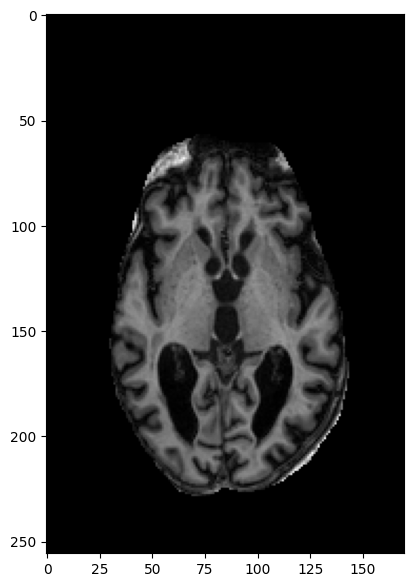

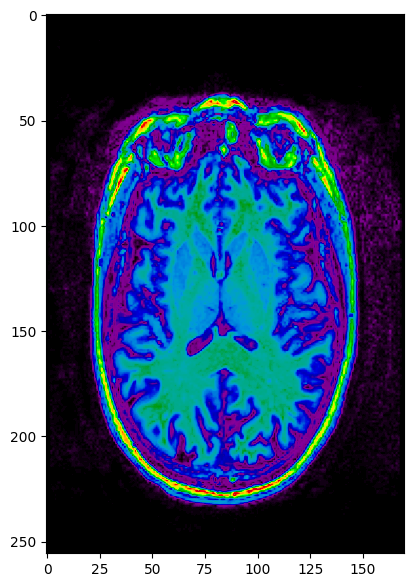

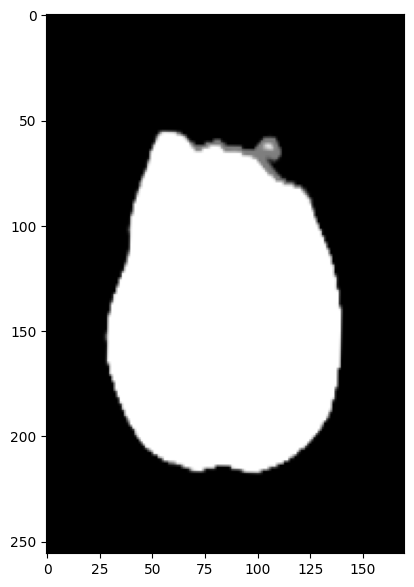

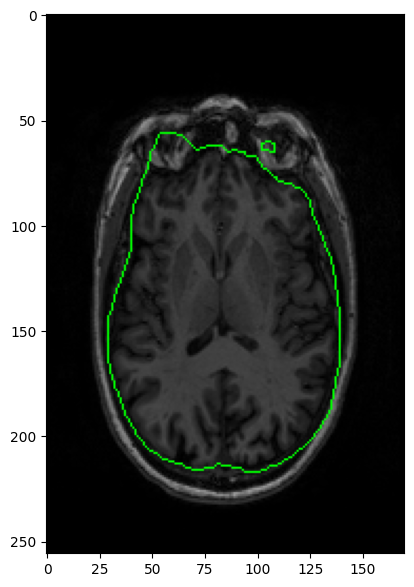

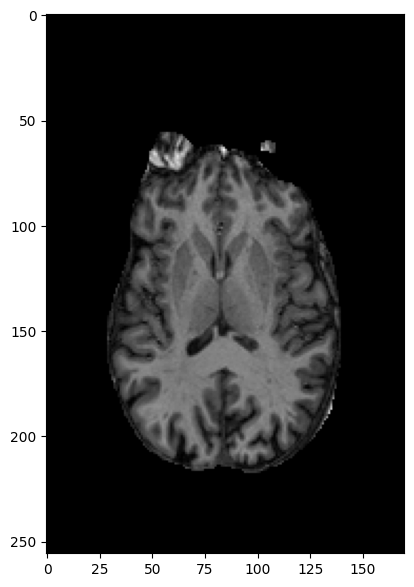

In [ ]:
from antspynet.utilities import brain_extraction

# Initialize an empty list to store the generated probabilistic brain masks
prob_brain_masks = []

# Loop through all items in the raw_examples list
for raw_example in raw_examples:
    # Create the full file path by joining the base directory with the path to the specific image file
    raw_img_path = os.path.join(BASE_DIR, 'assets', 'raw_examples', raw_example)

    # Read the image using AntsPy's image_read function, specifying reorientation to 'IAL'
    raw_img_ants = ants.image_read(raw_img_path, reorient='IAL')

    # Print the shape of the image as a numpy array in the format (Z, X, Y)
    print(f'shape = {raw_img_ants.numpy().shape} -> (Z, X, Y)')

    # Display the 3D array using a custom function 'explore_3D_array' with the image array and a specified colormap
    explore_3D_array(arr=raw_img_ants.numpy(), cmap='nipy_spectral')

    # Generate a probabilistic brain mask using the 'brain_extraction' function
    # The 'modality' parameter specifies the imaging modality as 'bold'
    # The 'verbose' parameter is set to 'True' to display detailed progress information
    prob_brain_mask = brain_extraction(raw_img_ants, modality='bold', verbose=True)

    # Append the generated probabilistic brain mask to the list
    prob_brain_masks.append(prob_brain_mask)

    # Print the filename or any relevant information about the current image (optional)
    print(f"Probabilistic Brain Mask for: {raw_example}")

    # Print the probabilistic brain mask
    print(prob_brain_mask)

    # Visualize the probabilistic brain mask using the 'explore_3D_array' function
    # This function displays the 3D array representation of the brain mask
    explore_3D_array(prob_brain_mask.numpy())

    # Generate a binary brain mask from the probabilistic brain mask using a threshold
    brain_mask = ants.get_mask(prob_brain_mask, low_thresh=0.5)

    # Visualize the original image overlaid with the brain mask contour
    explore_3D_array_with_mask_contour(raw_img_ants.numpy(), brain_mask.numpy())

    # Define the output folder path by joining the base directory with the 'assets' and 'preprocessed' directories
    out_folder = os.path.join(BASE_DIR, 'assets', 'preprocessed')

    # Create a subfolder within the 'preprocessed' directory named after the raw file (without extension)
    out_folder = os.path.join(out_folder, raw_example.split('.')[0])  # Create folder with name of the raw file

    # Create the output folder if it doesn't exist already
    os.makedirs(out_folder, exist_ok=True)  # Create folder if it doesn't exist

    # Generate a filename by adding the suffix 'brainMaskByDL' to the original raw file name
    out_filename = add_suffix_to_filename(raw_example, suffix='brainMaskByDL')

    # Create the full output file path by joining the output folder with the generated filename
    out_path = os.path.join(out_folder, out_filename)

    # Print the relative path of the input raw image file (excluding the base directory)
    print(raw_img_path[len(BASE_DIR):])

    # Print the relative path of the output file (excluding the base directory)
    print(out_path[len(BASE_DIR):])

    # Save the brain mask to a file
    brain_mask.to_file(out_path)

    # Create a masked image by applying the binary brain mask ('brain_mask') to the original image ('raw_img_ants')
    masked = ants.mask_image(raw_img_ants, brain_mask)

    # Visualize the 3D array representation of the masked image
    explore_3D_array(masked.numpy())

    # Generate a filename by adding the suffix 'brainMaskedByDL' to the original raw file name
    out_filename = add_suffix_to_filename(raw_example, suffix='brainMaskedByDL')

    # Create the full output file path by joining the output folder with the generated filename
    out_path = os.path.join(out_folder, out_filename)

    # Print the relative path of the input raw image file (excluding the base directory)
    print(raw_img_path[len(BASE_DIR):])

    # Print the relative path of the output file (excluding the base directory)
    print(out_path[len(BASE_DIR):])

    # Save the masked image ('masked') to a file specified by 'out_path'
    masked.to_file(out_path)
